In [1]:
import scanpy as sc
import os
import bin2cell as b2c
import celltypist
from celltypist import models
import numpy as np
from matplotlib import rcParams
from matplotlib import font_manager
import matplotlib.pyplot as plt
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')
font_manager.fontManager.addfont(".../software/Arial.ttf")
print(font_manager.findfont("Arial"))
plt.rcParams["font.sans-serif"] = ["Arial"]
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')

/nfs/team205/ny1/ThymusSpatialAtlas/software/Arial.ttf


This notebook will compare the Bin2cell segmentation (he or gex) object with the default 10X 8um binned outputs .


In [2]:
path008 = ".../visium_hd/gut_public/square_008um/"
path002 = ".../visium_hd/gut_public/square_002um/"
source_image_path = ".../10X_datasets/human_CRC/Visium_HD_Human_Colon_Cancer_tissue_image.btf"

# Load 8um default object 

Loading the count matrix currently requires a bespoke loader function as 10X have moved the spot coordinates into a Parquet file. The required syntax changes have been [offered to Scanpy](https://github.com/scverse/scanpy/pull/2992) so hopefully just using Scanpy's default loader will be sufficient soon.

In [3]:
bdata = b2c.read_visium(path008, source_image_path = source_image_path)
bdata.var_names_make_unique()

In [4]:
bdata.raw = bdata.copy()

## Some filtering

In [5]:
sc.pp.filter_genes(bdata, min_cells=3)
sc.pp.filter_cells(bdata, min_genes=100)
sc.pp.calculate_qc_metrics(bdata,inplace=True)

In [6]:
sc.pp.highly_variable_genes(bdata,n_top_genes=5000,flavor="seurat_v3")
sc.pp.normalize_total(bdata,target_sum=1e4)
sc.pp.log1p(bdata)

# Predict cell types from 2 models and combine them

In [7]:
predictions_8bin_mega = celltypist.annotate(bdata, model ='/nfs/team205/rb29/VisiumHD_intestine/Src/celltypist_models/model_from_megaGut_colon_CRC_level3.pkl', majority_voting = False)
predictions_8bin_crc = celltypist.annotate(bdata, model = 'Human_Colorectal_Cancer.pkl', majority_voting = False)

🔬 Input data has 419309 cells and 18058 genes
🔗 Matching reference genes in the model
🧬 2440 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 419309 cells and 18058 genes
🔗 Matching reference genes in the model
🧬 3733 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [8]:
# combine 2 models for cell annotations
# add the healthy gut model 
bdata = predictions_8bin_mega.to_adata()
bdata.obs['predicted_labels_healthy'] = bdata.obs['predicted_labels'] 
bdata.obs['conf_score_healthy'] = bdata.obs['conf_score'] 

# add the colorectal cancer model
bdata = predictions_8bin_crc.to_adata()
bdata.obs['predicted_labels_crc'] = bdata.obs['predicted_labels'] 
bdata.obs['conf_score_crc'] = bdata.obs['conf_score'] 

# remove old annotations
del bdata.obs['predicted_labels'] 
del bdata.obs['conf_score']

# find the cell that have higher confidence in the crc model 
bdata.obs['higher_in_crc'] = bdata.obs['conf_score_healthy']<bdata.obs['conf_score_crc']

# eclude the ones that labeled as unknown in crc model
bdata.obs.loc[bdata.obs['predicted_labels_crc']=='Unknown','higher_in_crc'] = False
bdata.obs['higher_in_crc'].value_counts()

higher_in_crc
True     278323
False    140986
Name: count, dtype: int64

In [9]:
# create new unified annotations 
bdata.obs['predicted_labels'] = bdata.obs['predicted_labels_healthy']
bdata.obs['predicted_labels'] = bdata.obs['predicted_labels'].astype('object')
bdata.obs.loc[bdata.obs['higher_in_crc'],'predicted_labels'] = bdata.obs.loc[bdata.obs['higher_in_crc'],'predicted_labels_crc']
bdata.obs['predicted_labels'] = bdata.obs['predicted_labels'].astype('category')
bdata.obs['predicted_labels'] 

s_008um_00301_00321-1               CMS2
s_008um_00526_00291-1               CMS2
s_008um_00128_00278-1           Pericyte
s_008um_00052_00559-1         Colonocyte
s_008um_00504_00410-1               CMS2
                              ...       
s_008um_00252_00421-1        IgG+ Plasma
s_008um_00384_00793-1         Macrophage
s_008um_00565_00244-1          Stromal 2
s_008um_00353_00477-1    Epithelial_stem
s_008um_00595_00611-1     Myofibroblasts
Name: predicted_labels, Length: 419309, dtype: category
Categories (122, object): ['BEST4_enterocyte_colonocyte', 'B_GC_I', 'B_GC_II', 'B_memory', ..., 'cDC', 'gamma delta T cells', 'gdT', 'gdT_naive']

In [10]:
bdata = bdata[:, bdata.var["highly_variable"]].copy()
sc.pp.scale(bdata, max_value=10)
sc.pp.pca(bdata, use_highly_variable=True)
sc.pp.neighbors(bdata)
sc.tl.umap(bdata)

2024-06-19 12:08:42.021144: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-19 12:08:42.024520: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-19 12:08:42.063392: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-19 12:08:45.942604: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


... storing 'feature_types' as categorical
... storing 'genome' as categorical


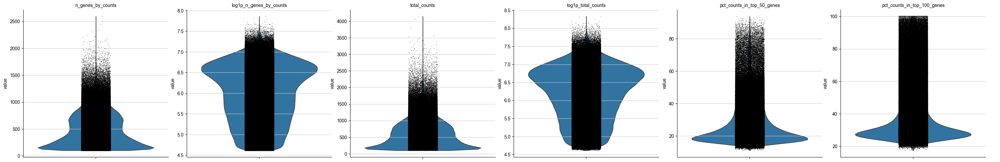

In [11]:
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(bdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes'],
             jitter=0.1, multi_panel=True)

## estimate embedding

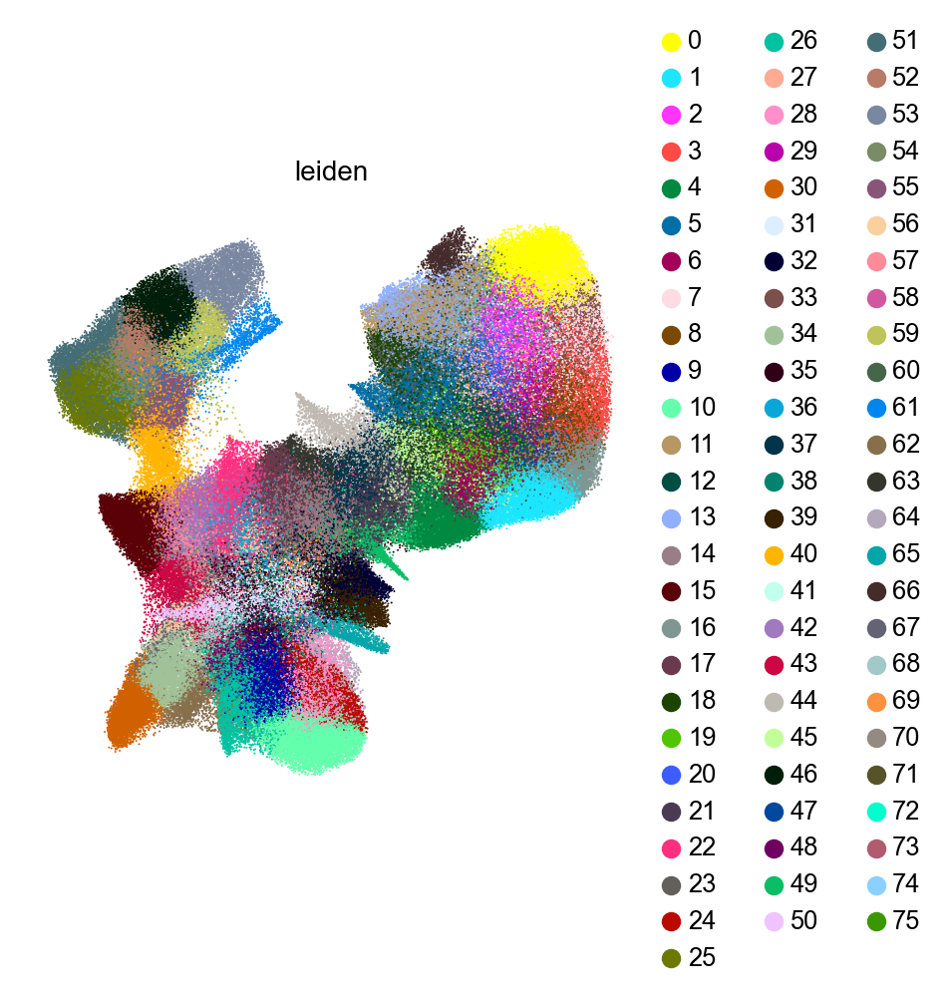

In [12]:
sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('.../visium_hd/gut_public/')
sc.tl.leiden(bdata,resolution=6,key_added='leiden')
sc.pl.umap(bdata,color=['leiden'],size=2,wspace=0.25,frameon=False)

# recover raw reads and save 

In [13]:
bdata.raw.to_adata().write('.../visium_hd/gut_public/crc_8um.h5ad')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


# b2c he + salvage object 

In [14]:
cdata = sc.read_h5ad(path002+'b2c_crc.h5ad')
cdata.var_names_make_unique()
cdata = cdata[cdata.obs['bin_count']>5] # min 6 bins
#need integers for seuratv3 hvgs
cdata.X.data = np.round(cdata.X.data)
cdata.raw = cdata.copy()

In [15]:
sc.pp.filter_genes(cdata, min_cells=3)
sc.pp.filter_cells(cdata,min_genes=100)
sc.pp.calculate_qc_metrics(cdata,inplace=True)

In [16]:
sc.pp.highly_variable_genes(cdata,n_top_genes=5000,flavor="seurat_v3")
sc.pp.normalize_total(cdata,target_sum=1e4)
sc.pp.log1p(cdata)

# Predict cell types from 2 models and combine them

In [17]:
predictions_b2c_mega = celltypist.annotate(cdata, model ='/nfs/team205/rb29/VisiumHD_intestine/Src/celltypist_models/model_from_megaGut_colon_CRC_level3.pkl', majority_voting = False)
predictions_b2c_crc = celltypist.annotate(cdata, model = 'Human_Colorectal_Cancer.pkl', majority_voting = False)

🔬 Input data has 235474 cells and 18057 genes
🔗 Matching reference genes in the model
🧬 2439 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
🔬 Input data has 235474 cells and 18057 genes
🔗 Matching reference genes in the model
🧬 3733 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [18]:
# combine 2 models for cell annotations
# add the healthy gut model 
cdata = predictions_b2c_mega.to_adata()
cdata.obs['predicted_labels_healthy'] = cdata.obs['predicted_labels'] 
cdata.obs['conf_score_healthy'] = cdata.obs['conf_score'] 

# add the colorectal cancer model
cdata = predictions_b2c_crc.to_adata()
cdata.obs['predicted_labels_crc'] = cdata.obs['predicted_labels'] 
cdata.obs['conf_score_crc'] = cdata.obs['conf_score'] 

# remove old annotations
del cdata.obs['predicted_labels'] 
del cdata.obs['conf_score']

# find the cell that have higher confidence in the crc model 
cdata.obs['higher_in_crc'] = cdata.obs['conf_score_healthy']<cdata.obs['conf_score_crc']

# eclude the ones that labeled as unknown in crc model
cdata.obs.loc[cdata.obs['predicted_labels_crc']=='Unknown','higher_in_crc'] = False
cdata.obs['higher_in_crc'].value_counts()

higher_in_crc
True     158930
False     76544
Name: count, dtype: int64

In [19]:
# create new unified annotations 
cdata.obs['predicted_labels'] = cdata.obs['predicted_labels_healthy']
cdata.obs['predicted_labels'] = cdata.obs['predicted_labels'].astype('object')
cdata.obs.loc[cdata.obs['higher_in_crc'],'predicted_labels'] = cdata.obs.loc[cdata.obs['higher_in_crc'],'predicted_labels_crc']
cdata.obs['predicted_labels'] = cdata.obs['predicted_labels'].astype('category')
cdata.obs['predicted_labels'] 

1                       TA
2         Pro-inflammatory
3             CD8+ T cells
4            B_plasma_IgA1
5                     CMS2
                ...       
532459                CMS2
532497       B_plasma_IgA1
532503                CMS2
532778                CMS2
532819                CMS2
Name: predicted_labels, Length: 235474, dtype: category
Categories (123, object): ['BEST4_enterocyte_colonocyte', 'B_GC_I', 'B_GC_II', 'B_memory', ..., 'cDC', 'gamma delta T cells', 'gdT', 'gdT_naive']

In [20]:
cdata = cdata[:, cdata.var["highly_variable"]]
sc.pp.scale(cdata, max_value=10)
sc.pp.pca(cdata, use_highly_variable=True)
sc.pp.neighbors(cdata)
sc.tl.umap(cdata)

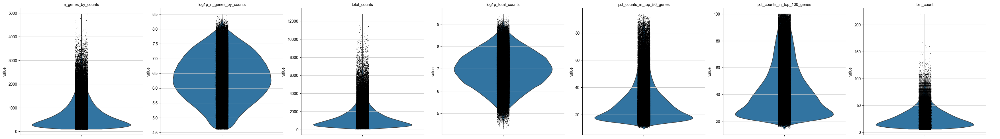

In [21]:
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(cdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes','bin_count'],
             jitter=0.05, multi_panel=True)

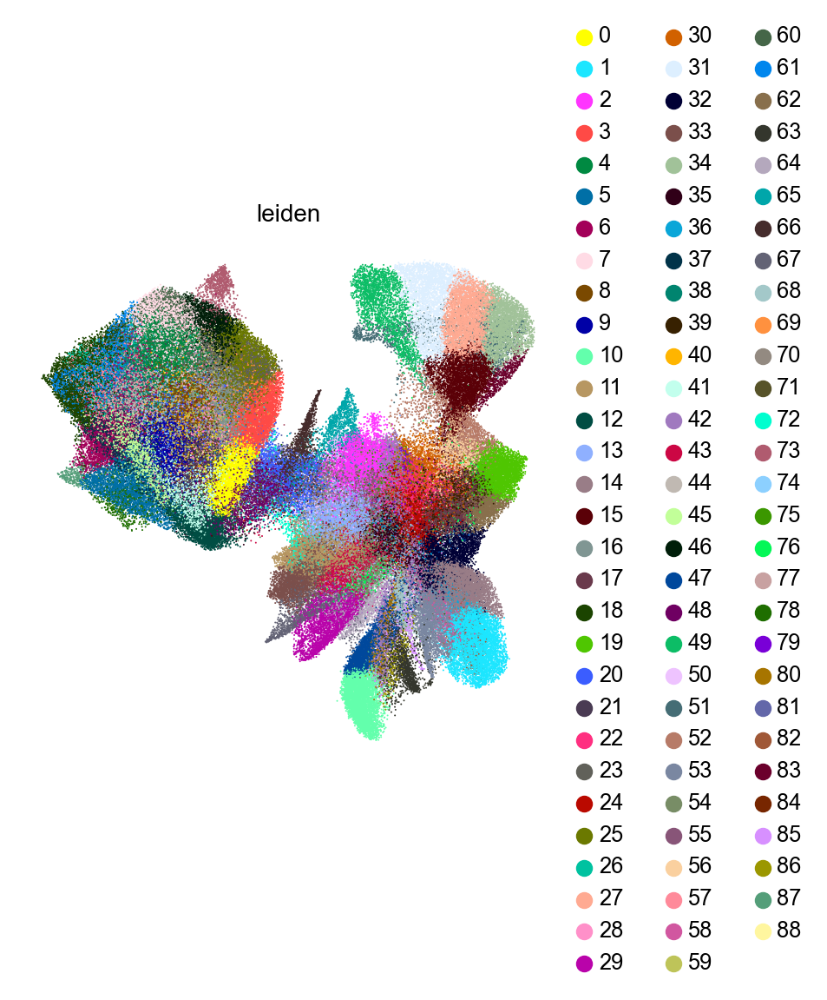

In [22]:
sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('.../visium_hd/gut_public/')
sc.tl.leiden(cdata,resolution=6,key_added='leiden')
sc.pl.umap(cdata,color=['leiden'],size=2,wspace=0.25,frameon=False)

# recover raw reads and save 

In [23]:
cdata.raw.to_adata().write('.../visium_hd/gut_public/crc_b2c.h5ad')

# load objects

In [24]:
bdata = sc.read_h5ad('.../visium_hd/gut_public/crc_8um.h5ad')
cdata = sc.read_h5ad('.../visium_hd/gut_public/crc_b2c.h5ad')

In [25]:
# fix the conf score value 
bdata.obs['conf_score'] = bdata.obs['conf_score_healthy']
bdata.obs.loc[bdata.obs['higher_in_crc'],'conf_score'] = bdata.obs.loc[bdata.obs['higher_in_crc'],'conf_score_crc']

In [26]:
# fix the conf score value 
cdata.obs['conf_score'] = cdata.obs['conf_score_healthy']
cdata.obs.loc[cdata.obs['higher_in_crc'],'conf_score'] = cdata.obs.loc[cdata.obs['higher_in_crc'],'conf_score_crc']

In [27]:
bdata

AnnData object with n_obs × n_vars = 419309 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels_healthy', 'conf_score_healthy', 'predicted_labels_crc', 'conf_score_crc', 'higher_in_crc', 'predicted_labels', 'leiden', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [28]:
cdata

AnnData object with n_obs × n_vars = 235474 × 18058
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels_healthy', 'conf_score_healthy', 'predicted_labels_crc', 'conf_score_crc', 'higher_in_crc', 'predicted_labels', 'leiden', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_cropped'
    obsp: 'connectivities', 'distances'

In [29]:
# unify labels
merged_annotations = {
# B cells and plasma cells:
    'B_cells':['B_GC_I','B_GC_II','B_preB','B_proB','CD19+CD20+ B','B_naive', 'B_memory','B_plasmablast'],
    "B_IgA_plasma":['IgA+ Plasma', 'B_plasma_IgA1','B_plasma_IgA2'],
    "B_IgG_plasma":['IgG+ Plasma', 'B_plasma_IgG'],
    'B_IgM_plasma':['B_plasma_IgM'],
    
# Epithelial:    
    'BEST4_colonocyte':['BEST4_enterocyte_colonocyte'],
    'Colonocyte': ['Colonocyte','Enterocyte'],
    "DCS_MUC17":['DCS_MUC17','DCS_MUC17_cycling'],
    'Goblet':['Goblet','Goblet cells''Goblet_cycling','Goblet_progenitor'],
    'Mature_colonocyte':['Mature_colonocyte','Mature Enterocytes type 1','Mature Enterocytes type 2'],
    'Intermediate_colonocyte':['Intermediate'],
    'TA':['TA','Stem-like/TA'],
    'Epithelial_stem': ['Epithelial_stem'],
    'Tuft': ['Tuft'],
    "ECC":['Enterochromaffin'],
    "EEC":['Enteroendocrine','Enteroendocrine_G','Enteroendocrine_MX','Enteroendocrine_X','Enteroendocrine_progenitor'],
#Cancer cells:
    'CMS1':['CMS1'],#very few predicted, this tumor is CMS2.
    'CMS2':['CMS2'],
    'CMS3':['CMS3'],# Normal TA cells are predicted as CMS3. 
# Endothelial:
    'EC_arterial':['EC_arterial_1','EC_arterial_2'],
    'EC_venous':['EC_venous'],
    'EC_lymphatic': ['EC_lymphatic', 'Lymphatic ECs'],#lacteals
    'EC_capillary': ['EC_capillary'],
    'EC_cycling':['EC_cycling','Proliferative ECs'],
    'Tip-like ECs': ['Tip-like ECs'], #TECs: Tip-like ECs are involved in the promotion of tumor angiogenesis and inhibition on anti-tumor immune responses
    'Stalk-like ECs': ['Stalk-like ECs'], #TECs:https://doi.org/10.1158/0008-5472.CAN-17-2728
    #in tumor angiogenesis, dynamic interactions between specialized ECs allow some ECs to sprout and migrate from a blood vessel (so-called tip cells), whereas other cells remain relatively more static and form the shaft behind the sprout (so-called stalk cells).
 
#Myeloid:
    'cDC':['cDC','DC_cDC1','DC_cDC2','DC_migratory'],
    'Mono/neutrophil_MPO':['Mono/neutrophil_MPO'],#There are more neutrophils than these ones, annotate from the clusters
    'Monocyte':['Monocyte'],
    'Macrophage':['Macrophage','Macrophage_CD5L','Macrophage_LYVE1','Macrophage_MMP9','Macrophage_TREM2'],
    'Macrophage_SPP1+':['SPP1+'],
    'Macrophage_prolif': ['Proliferating'],
    'Macrophage_Pro-inflam':['Pro-inflammatory'],
    'Mast':['Mast','Mast cells'],

#Mesenchymal:
    'Fibroblast':['Oral_mucosa_fibroblast','Rectum_fibroblast', 'Villus_fibroblast_F3',
                  'Crypt_fibroblast_PI16','Fibroblast_reticular','Lamina_propria_fibroblast_ADAMDEC1'],
    'Myofibroblast':['Myofibroblast','Myofibroblasts'],
    "Smooth_muscle":['Vascular_smooth_muscle','Smooth muscle cells'],
    "Stromal":['Stromal 1','Stromal 2','Stromal 3'],
    'Pericyte':['Pericyte','Pericytes','Immune_recruiting_pericyte'],

#Enteric Nervous System/Glia:
    'Neural':['Enteric_neural_crest_cycling','Neuroblast'],
    'Glial':['Glial/Enteric_neural_crest','Glial_1','Glial_2','Glial_3','Enteric glial cells'],

# T cells / ILCs:
    'ILC3':['ILC3'],
    'Tfh':['Tfh','Tfh_naive','T follicular helper cells'],
    'Th17':['Trm_Th17','T helper 17 cells'],
    'T/NK_cycling':['T/NK_cycling'],
    'gdT':['gdT','gdT_naive','gamma delta T cells'],
    'Treg':[ 'Treg', 'Treg_IL10', 'Regulatory T cells'],
    'CD4_Tcells':['CD4+ T cells','Tnaive/cm_CD4','Trm_CD4'],
    'CD8_Tcells':['CD8+ T cells','Tnaive/cm_CD8','Trm/em_CD8','Trm_CD8'],
    'MAIT':['MAIT'], 
    'NKcells':['NK cells','NK_CD16','NK_CD56bright'],
#OTHERS:
   'Erythrocytes':['Erythrocytes'],
    
   'REMOVE!!':['Chief','Gastric_fetal_epithelial', 'Pareital','Surface_foveolar','Mesothelium','Microfold','DC_pDC','DC_langerhans',
               'Oesophagus_fibroblast','Follicular_DC','Mucous_gland_neck', 'Unknown', 'Cycling'],#MUC6+cells in CRC!!# 'Cycling' is Generic for all the celltypes!
}

In [30]:
bdata.obs['predicted_labels'] = bdata.obs['predicted_labels'].astype('object')
cdata.obs['predicted_labels'] = cdata.obs['predicted_labels'].astype('object')

for key,value in merged_annotations.items():
    print(key)
    bdata.obs.loc[bdata.obs['predicted_labels'].isin(value),'predicted_labels'] = key
    cdata.obs.loc[cdata.obs['predicted_labels'].isin(value),'predicted_labels'] = key

bdata.obs['predicted_labels'] = bdata.obs['predicted_labels'].astype('category')
cdata.obs['predicted_labels'] = cdata.obs['predicted_labels'].astype('category')

bdata = bdata[bdata.obs['predicted_labels']!='REMOVE!!']
cdata = cdata[cdata.obs['predicted_labels']!='REMOVE!!']


B_cells
B_IgA_plasma
B_IgG_plasma
B_IgM_plasma
BEST4_colonocyte
Colonocyte
DCS_MUC17
Goblet
Mature_colonocyte
Intermediate_colonocyte
TA
Epithelial_stem
Tuft
ECC
EEC
CMS1
CMS2
CMS3
EC_arterial
EC_venous
EC_lymphatic
EC_capillary
EC_cycling
Tip-like ECs
Stalk-like ECs
cDC
Mono/neutrophil_MPO
Monocyte
Macrophage
Macrophage_SPP1+
Macrophage_prolif
Macrophage_Pro-inflam
Mast
Fibroblast
Myofibroblast
Smooth_muscle
Stromal
Pericyte
Neural
Glial
ILC3
Tfh
Th17
T/NK_cycling
gdT
Treg
CD4_Tcells
CD8_Tcells
MAIT
NKcells
Erythrocytes
REMOVE!!


In [31]:
# # asses corespondance beteeen leiden clusters to cell types
from sklearn.metrics import homogeneity_score
print('8um homogeneity score - '+str(homogeneity_score(bdata.obs['leiden'],bdata.obs['predicted_labels'])))
print('b2c homogeneity score - '+str(homogeneity_score(cdata.obs['leiden'],cdata.obs['predicted_labels'])))

8um homogeneity score - 0.1814159976965761
b2c homogeneity score - 0.19982254652867557


# plotting 

In [32]:
os.chdir('.../visium_hd/gut_public/')

maxp pruned
LTSH dropped
cmap pruned
kern pruned
post pruned
PCLT dropped
JSTF dropped
DSIG dropped
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 37 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'P', 'S', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 19, 20, 21, 22, 23, 25, 27, 38, 51, 54, 55, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'GSUB': 37 glyphs after
Glyph names: ['.notdef', '.null', 'C', 'P', 'S', 'T', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 1

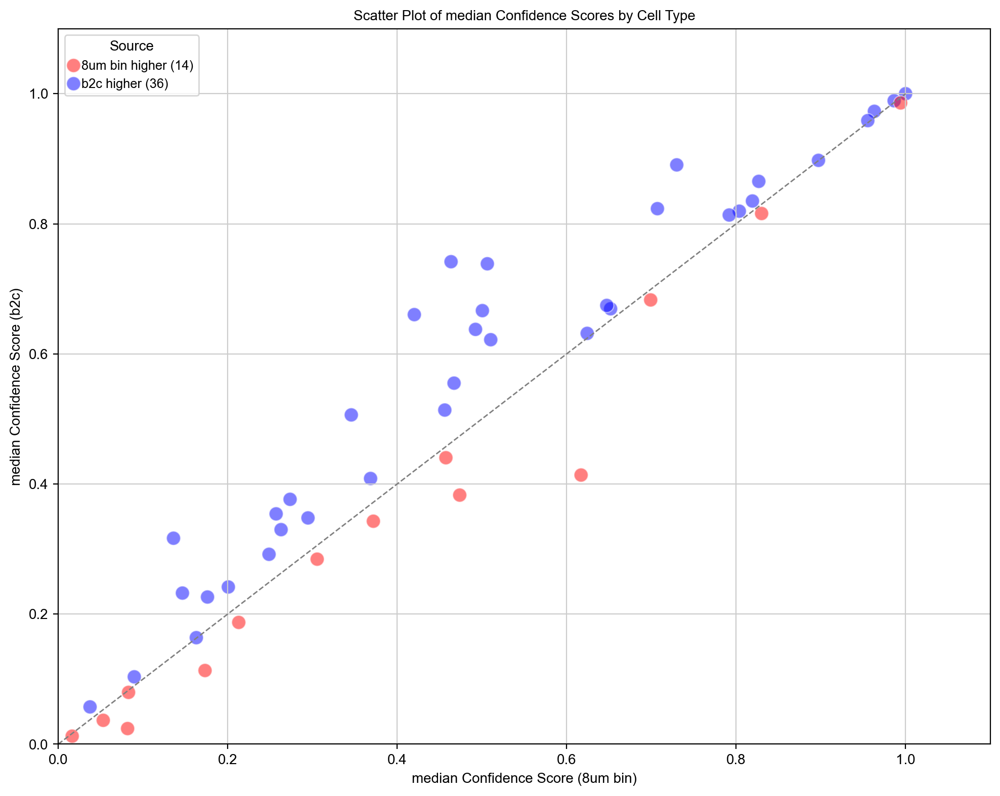

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the median confidence score for each cell type in bdata
bdata_medians = bdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
bdata_medians.set_index('predicted_labels', inplace=True)
bdata_medians['Source'] = '8um bin'
bdata_medians['counts'] = bdata.obs.groupby('predicted_labels')['conf_score'].count()

# Calculate the median confidence score for each cell type in cdata
cdata_medians = cdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
cdata_medians.set_index('predicted_labels', inplace=True)
cdata_medians['Source'] = 'b2c'
cdata_medians['counts'] = cdata.obs.groupby('predicted_labels')['conf_score'].count()

# Combine the results from all datasets
combined_medians = pd.concat([cdata_medians, bdata_medians], axis=1, keys=['b2c', '8um bin'])
combined_medians.columns = ['_'.join(col).strip() for col in combined_medians.columns.values]

# Calculate the maximum confidence score for each cell type across conditions
max_conf_scores = combined_medians[['b2c_median_conf_score', '8um bin_median_conf_score']].max(axis=1)
max_counts = combined_medians[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum confidence score lower than 0.01
cell_types_to_keep = max_conf_scores[max_conf_scores >= 0.01].index
cell_types_to_keep2 = max_counts[max_counts >= 50].index

combined_medians_filtered = combined_medians.loc[combined_medians.index.isin(cell_types_to_keep)]
combined_medians_filtered = combined_medians_filtered.loc[combined_medians_filtered.index.isin(cell_types_to_keep2)]

# Determine the color based on which condition has the higher median confidence score
combined_medians_filtered['color'] = combined_medians_filtered.apply(
    lambda row: 'red' if row['8um bin_median_conf_score'] > row['b2c_median_conf_score'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_medians_filtered['color'] == 'red')
higher_in_b2c = sum(combined_medians_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(10, 8))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_medians_filtered, 
                     x='8um bin_median_conf_score', y='b2c_median_conf_score', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_medians_filtered['8um bin_median_conf_score'].max() + 0.1)
plt.ylim(0, combined_medians_filtered['b2c_median_conf_score'].max() + 0.1)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [f'8um bin higher ({higher_in_8um})',f'b2c higher ({higher_in_b2c})',]
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of median Confidence Scores by Cell Type')
plt.xlabel('median Confidence Score (8um bin)')
plt.ylabel('median Confidence Score (b2c)')
plt.tight_layout()
plt.savefig('.../visium_hd/gut_public/figures/predictions_scatter_colored.pdf')
plt.show()
combined_medians_filtered.to_csv('.../visium_hd/gut_public/combined_medians_filtered_conf_score.csv')

822978660.py (33): 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
maxp pruned
LTSH dropped
cmap pruned
kern pruned
post pruned
PCLT dropped
JSTF dropped
DSIG dropped
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 39 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'M', 'P', 'S', 'T', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 19, 20, 21, 22, 23, 24, 25, 26, 27, 38, 48, 51, 54, 55, 66, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 92]
Closed glyph list over 'GSUB': 3

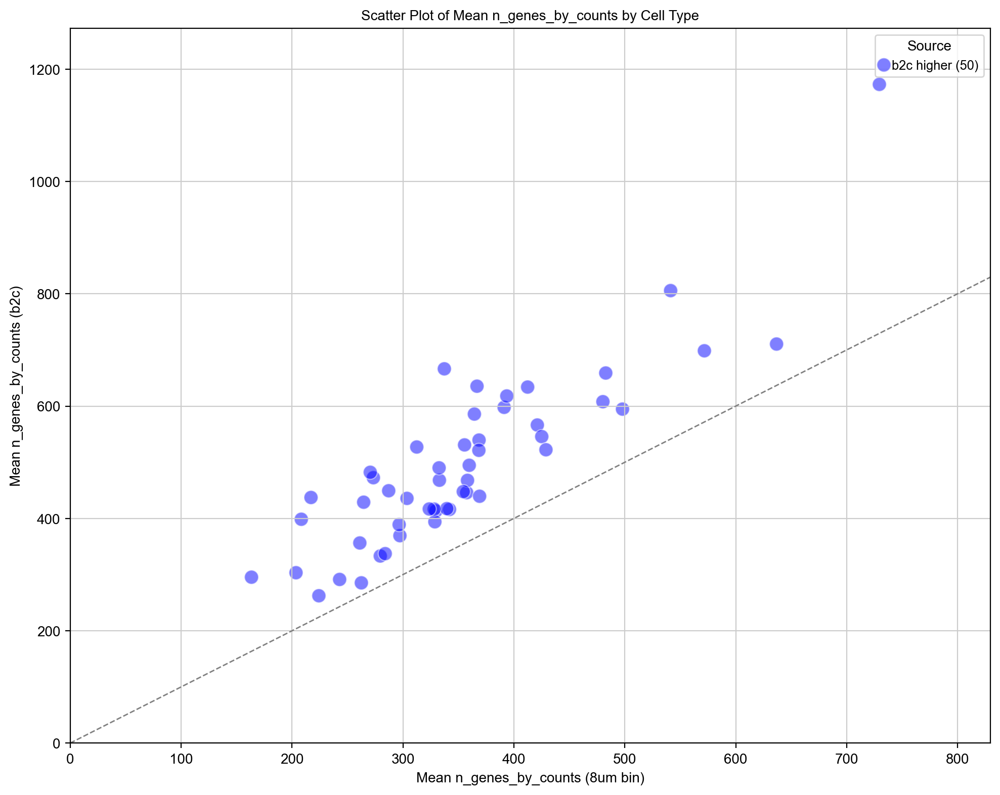

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the mean of n_genes_by_counts for each cell type in bdata
bdata_means = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
bdata_means.set_index('predicted_labels', inplace=True)
bdata_means['Source'] = '8um bin'
bdata_means['counts'] = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Calculate the mean of n_genes_by_counts for each cell type in cdata
cdata_means = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
cdata_means.set_index('predicted_labels', inplace=True)
cdata_means['Source'] = 'b2c'
cdata_means['counts'] = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Combine the results from all datasets
combined_means = pd.concat([cdata_means, bdata_means], axis=1, keys=['b2c', '8um bin'])
combined_means.columns = ['_'.join(col).strip() for col in combined_means.columns.values]

# Calculate the maximum n_genes_by_counts for each cell type across conditions
max_n_genes_by_counts = combined_means[['b2c_mean_n_genes_by_counts', '8um bin_mean_n_genes_by_counts']].max(axis=1)
max_counts = combined_means[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum n_genes_by_counts lower than 0.1
cell_types_to_keep = max_counts[max_counts >= 50].index

combined_means_filtered = combined_means.loc[combined_means.index.isin(cell_types_to_keep)]

# Determine the color based on which condition has the higher mean n_genes_by_counts
combined_means_filtered['color'] = combined_means_filtered.apply(
    lambda row: 'red' if row['8um bin_mean_n_genes_by_counts'] > row['b2c_mean_n_genes_by_counts'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_means_filtered['color'] == 'red')
higher_in_b2c = sum(combined_means_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(10, 8))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_means_filtered, 
                     x='8um bin_mean_n_genes_by_counts', y='b2c_mean_n_genes_by_counts', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
max_val = max(combined_means_filtered['8um bin_mean_n_genes_by_counts'].max(), combined_means_filtered['b2c_mean_n_genes_by_counts'].max()) + 100
plt.plot([0, max_val], [0, max_val], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_means_filtered['8um bin_mean_n_genes_by_counts'].max() + 100)
plt.ylim(0, combined_means_filtered['b2c_mean_n_genes_by_counts'].max() + 100)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [ f'b2c higher ({higher_in_b2c})',f'8um bin higher ({higher_in_8um})']
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of Mean n_genes_by_counts by Cell Type')
plt.xlabel('Mean n_genes_by_counts (8um bin)')
plt.ylabel('Mean n_genes_by_counts (b2c)')
plt.tight_layout()
plt.savefig('.../visium_hd/gut_public/figures/n_genes_scatter_8um_vs_b2c.pdf')
plt.show()
combined_means_filtered.to_csv('.../visium_hd/gut_public/combined_means_filtered_n_genes.csv')

In [35]:
bdata.write_h5ad('.../visium_hd/gut_public/crc_8um_anno.h5ad')
cdata.write_h5ad('.../visium_hd/gut_public/crc_b2c_anno.h5ad')

In [36]:
bdata = sc.read_h5ad('.../visium_hd/gut_public/crc_8um_anno.h5ad')
cdata = sc.read_h5ad('.../visium_hd/gut_public/crc_b2c_anno.h5ad')

In [37]:
cdata

AnnData object with n_obs × n_vars = 232540 × 18058
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels_healthy', 'conf_score_healthy', 'predicted_labels_crc', 'conf_score_crc', 'higher_in_crc', 'predicted_labels', 'leiden', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_cropped'
    obsp: 'connectivities', 'distances'

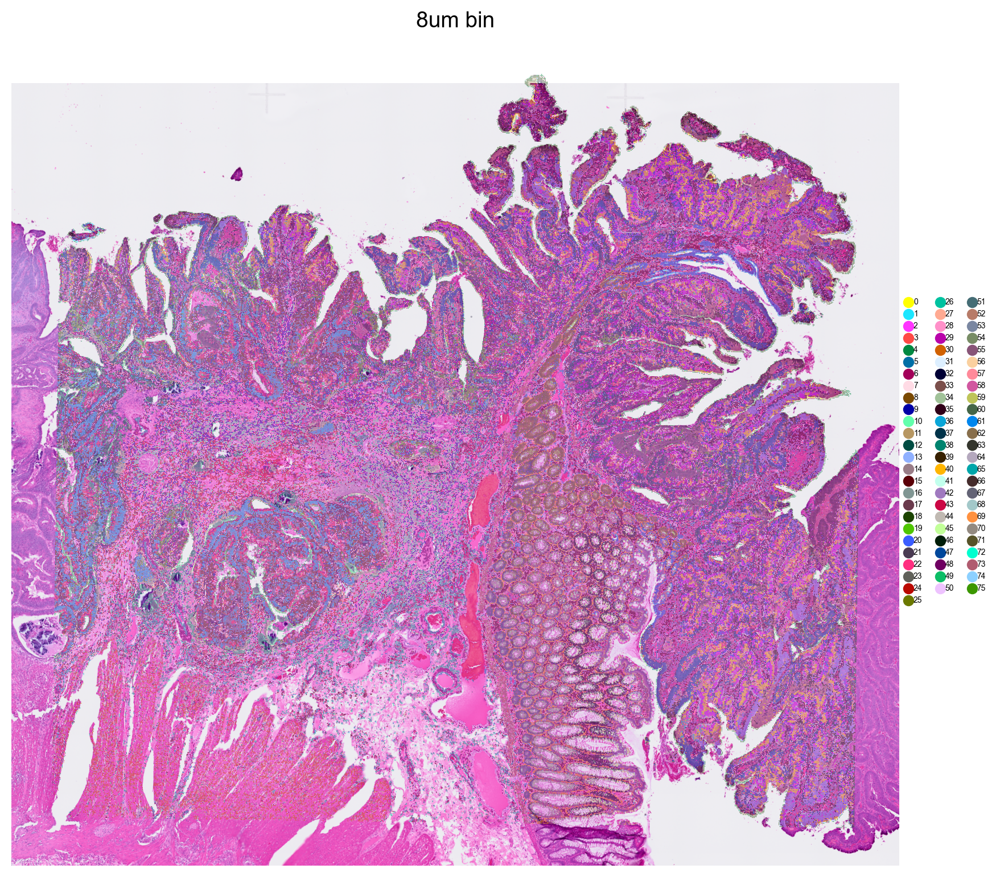

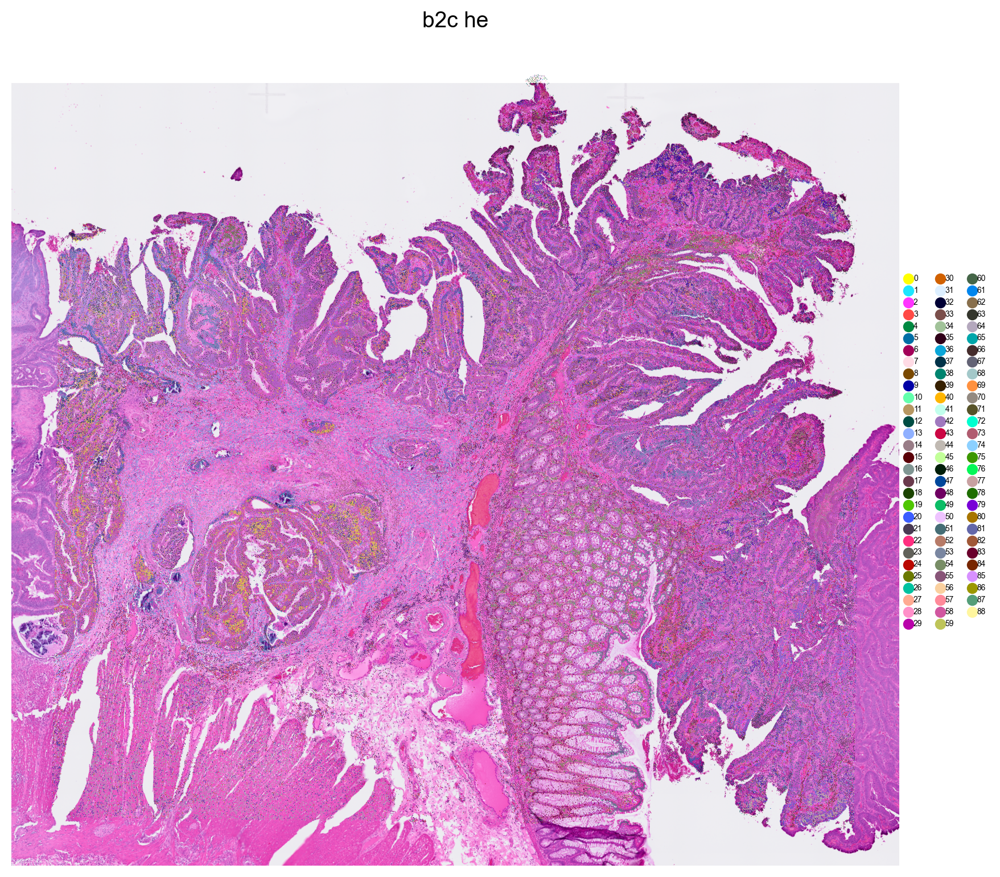

In [38]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.set_loglevel('WARNING')

#
# Confidence threshold
conf_th = 0

# Set figure parameters
sc.set_figure_params(dpi=100, dpi_save=2000, figsize=[10, 10], format='jpg')

# Plot for 8um bin
sc.pl.spatial(bdata, color='leiden',
              title='8um bin', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, save='_8bin_leiden')

# Plot for b2c he
sc.pl.spatial(cdata, color='leiden', 
              title='b2c he', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, save='_b2c_leiden',)


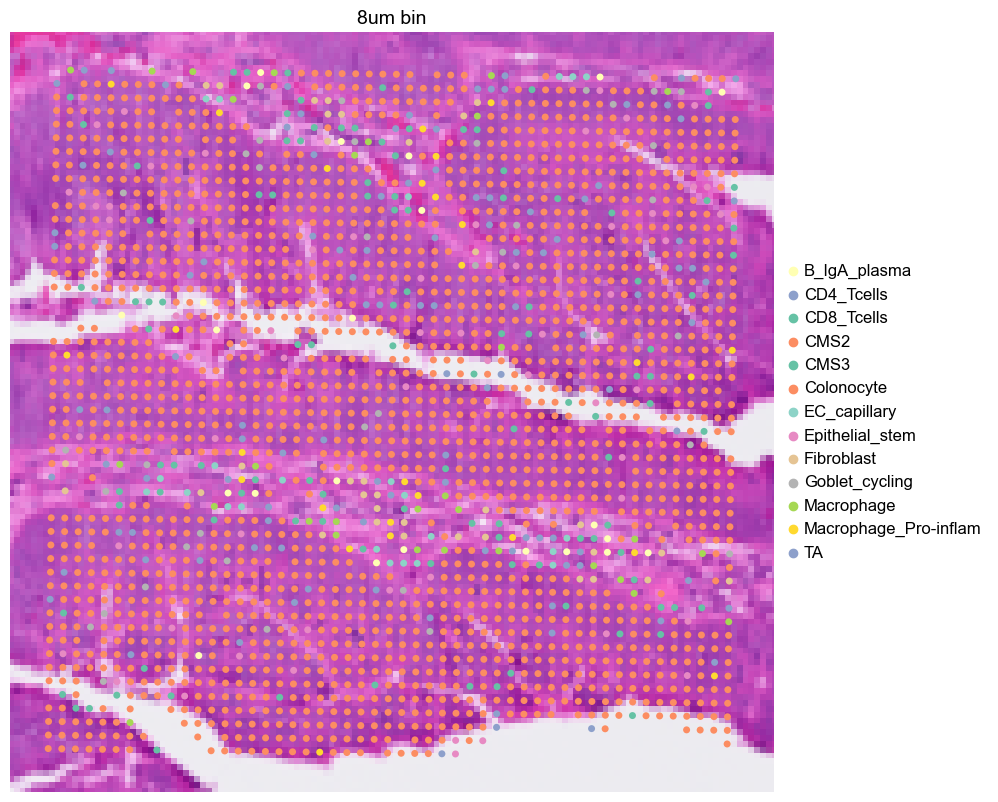

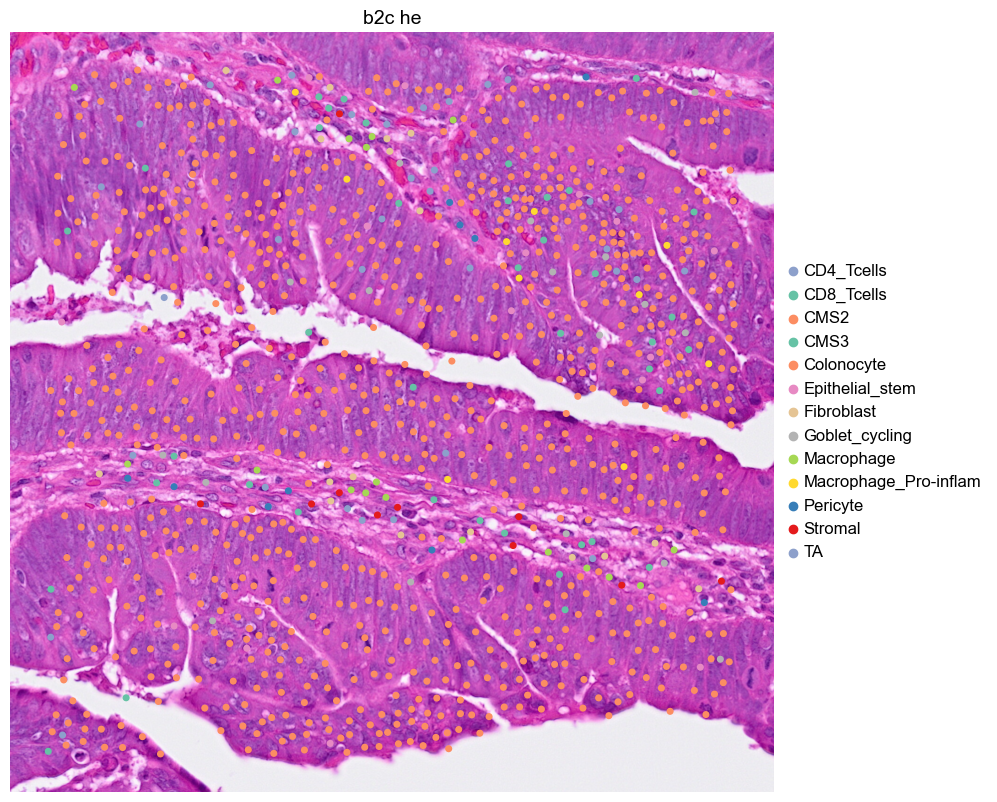

In [42]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.set_loglevel('WARNING')

# Confidence threshold
conf_th = 0.01
mask_thr = [1900, 2100, 2400, 2600]

# Define a mask to easily pull out this region of the object /4 is to account for 8um column data as opposed to b2c which is in the original 2um col data system 
bmask = ((bdata.obs['array_row'] >= mask_thr[0]/4) & 
         (bdata.obs['array_row'] <= mask_thr[1]/4) & 
         (bdata.obs['array_col'] >= mask_thr[2]/4) & 
         (bdata.obs['array_col'] <= mask_thr[3]/4))

# Define a mask to easily pull out this region of the object
cmask = ((cdata.obs['array_row'] >= mask_thr[0]) & 
         (cdata.obs['array_row'] <= mask_thr[1]) & 
         (cdata.obs['array_col'] >= mask_thr[2]) & 
         (cdata.obs['array_col'] <= mask_thr[3]))

# Set figure parameters
sc.set_figure_params(dpi=50, dpi_save=300, figsize=[10, 10], format='pdf')

# Filter data based on the masks and confidence threshold
temp_bdata = bdata[bmask]
temp_bdata = temp_bdata[temp_bdata.obs['conf_score'] > conf_th]

temp_cdata = cdata[cmask]
temp_cdata = temp_cdata[temp_cdata.obs['conf_score'] > conf_th]

# Filter out label types with fewer than 20 members in bdata
b_label_counts = temp_bdata.obs['predicted_labels'].value_counts()
b_labels_to_keep = b_label_counts[b_label_counts >= 20].index
temp_bdata = temp_bdata[temp_bdata.obs['predicted_labels'].isin(b_labels_to_keep)]

# Filter out label types with fewer than 10 members in cdata
c_label_counts = temp_cdata.obs['predicted_labels'].value_counts()
c_labels_to_keep = c_label_counts[c_label_counts >= 10].index
temp_cdata = temp_cdata[temp_cdata.obs['predicted_labels'].isin(c_labels_to_keep)]

# Get unique labels from both datasets
b_labels = set(temp_bdata.obs['predicted_labels'].unique())
c_labels = set(temp_cdata.obs['predicted_labels'].unique())

# Create sets of mutual and unique labels
mutual_labels = b_labels & c_labels
unique_b_labels = b_labels - mutual_labels
unique_c_labels = c_labels - mutual_labels

# Ensure enough unique colors by combining multiple palettes if necessary
mutual_palette = sns.color_palette("Set2", len(mutual_labels))
unique_b_palette = sns.color_palette("Set3", len(unique_b_labels))
unique_c_palette = sns.color_palette("Set1", len(unique_c_labels))

color_dict = {}
color_dict.update(dict(zip(mutual_labels, mutual_palette)))
color_dict.update(dict(zip(unique_b_labels, unique_b_palette)))
color_dict.update(dict(zip(unique_c_labels, unique_c_palette)))

# Plot for 8um bin with consistent colors for mutual labels
sc.pl.spatial(temp_bdata, color='predicted_labels', title='8um bin', size=20, img_key='hires', legend_fontsize=12, spot_size=0.75, frameon=False, save='_8bin_all_cells_roi_1.png', palette=color_dict)

# Plot for b2c with consistent colors for mutual labels
sc.pl.spatial(temp_cdata, color='predicted_labels', title='b2c he', size=20, img_key='0.3_mpp', legend_fontsize=12, spot_size=0.75, frameon=False, save='_b2c_all_cells_roi_1.png', palette=color_dict, basis='spatial_cropped')


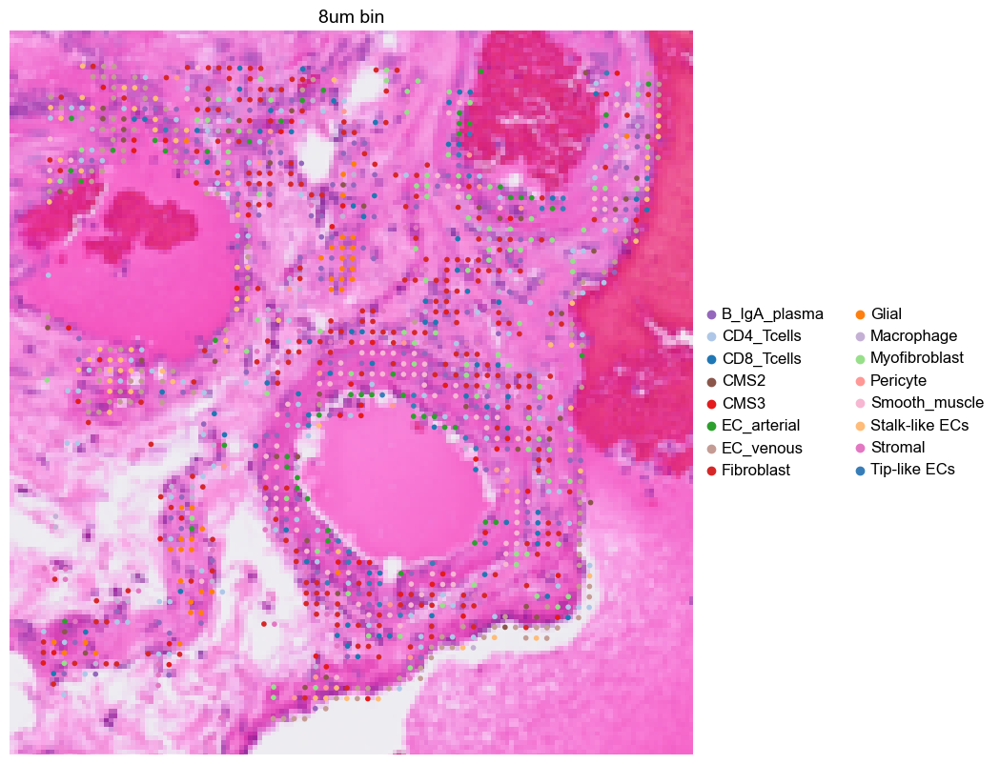

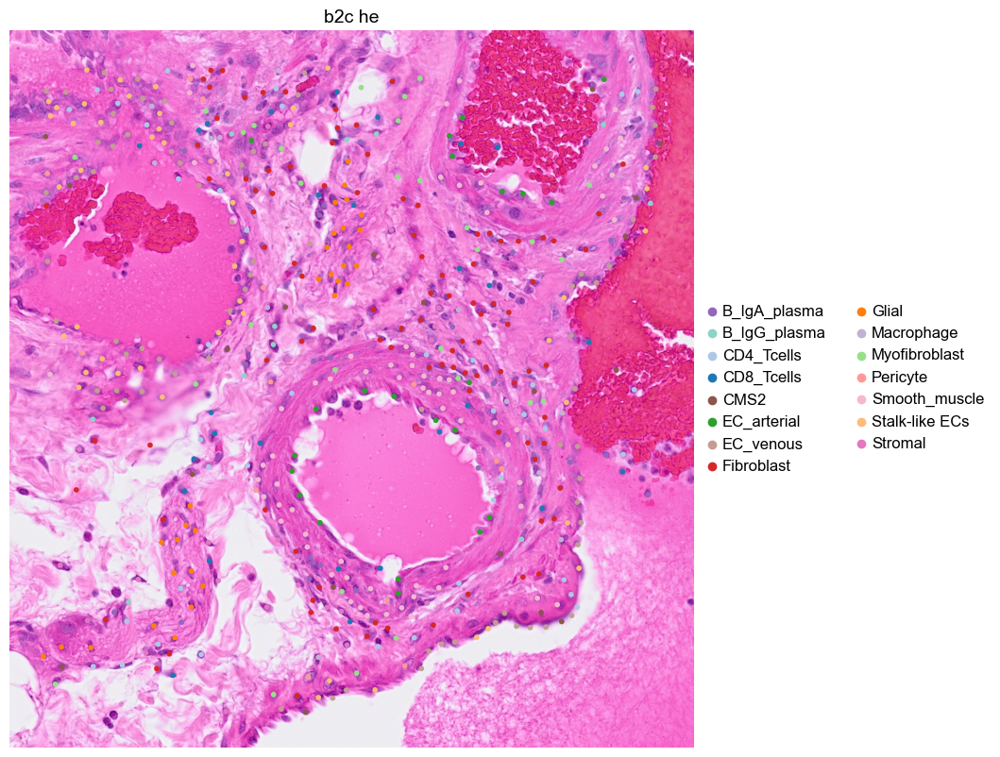

In [40]:
# region 2 

mask_thr = [500,750,1500,1750]
#define a mask to easily pull out this region of the object /4 is to account for 8um column data as oppoed to b2c which is in the original 2um col data system 
bmask = ((bdata.obs['array_row'] >= mask_thr[0]/4) & 
        (bdata.obs['array_row'] <= mask_thr[1]/4) & 
        (bdata.obs['array_col'] >= mask_thr[2]/4) & 
        (bdata.obs['array_col'] <= mask_thr[3]/4))

#define a mask to easily pull out this region of the object
cmask = ((cdata.obs['array_row'] >= mask_thr[0]) & 
        (cdata.obs['array_row'] <= mask_thr[1]) & 
        (cdata.obs['array_col'] >= mask_thr[2]) & 
        (cdata.obs['array_col'] <= mask_thr[3]))


# Set figure parameters
sc.set_figure_params(dpi=50, dpi_save=300, figsize=[10, 10], format='pdf')

# Filter data based on the masks and confidence threshold
temp_bdata = bdata[bmask]
temp_bdata = temp_bdata[temp_bdata.obs['conf_score'] > conf_th]

temp_cdata = cdata[cmask]
temp_cdata = temp_cdata[temp_cdata.obs['conf_score'] > conf_th]

# Filter out label types with fewer than 20 members in bdata
b_label_counts = temp_bdata.obs['predicted_labels'].value_counts()
b_labels_to_keep = b_label_counts[b_label_counts >= 20].index
temp_bdata = temp_bdata[temp_bdata.obs['predicted_labels'].isin(b_labels_to_keep)]

# Filter out label types with fewer than 10 members in cdata
c_label_counts = temp_cdata.obs['predicted_labels'].value_counts()
c_labels_to_keep = c_label_counts[c_label_counts >= 10].index
temp_cdata = temp_cdata[temp_cdata.obs['predicted_labels'].isin(c_labels_to_keep)]

# Get unique labels from both datasets
b_labels = set(temp_bdata.obs['predicted_labels'].unique())
c_labels = set(temp_cdata.obs['predicted_labels'].unique())

# Create sets of mutual and unique labels
mutual_labels = b_labels & c_labels
unique_b_labels = b_labels - mutual_labels
unique_c_labels = c_labels - mutual_labels

# Ensure enough unique colors by combining multiple palettes if necessary
mutual_palette = sns.color_palette("tab20", len(mutual_labels))
unique_b_palette = sns.color_palette("Set1", len(unique_b_labels))
unique_c_palette = sns.color_palette("Set3", len(unique_c_labels))

color_dict = {}
color_dict.update(dict(zip(mutual_labels, mutual_palette)))
color_dict.update(dict(zip(unique_b_labels, unique_b_palette)))
color_dict.update(dict(zip(unique_c_labels, unique_c_palette)))

# Plot for 8um bin with consistent colors for mutual labels
sc.pl.spatial(temp_bdata, color='predicted_labels', title='8um bin', size=20, img_key='hires', legend_fontsize=12, spot_size=0.75, frameon=False, save='_8bin_all_cells_roi_2.png', palette=color_dict)

# Plot for b2c with consistent colors for mutual labels
sc.pl.spatial(temp_cdata, color='predicted_labels', title='b2c he', size=20, img_key='0.3_mpp', legend_fontsize=12, spot_size=0.75, frameon=False, save='_b2c_all_cells_roi_2.png', palette=color_dict, basis='spatial_cropped')

In [ ]:
# region all

# Filter data based on the masks and confidence threshold
temp_bdata = bdata[bdata.obs['conf_score'] > conf_th]

temp_cdata = cdata[cdata.obs['conf_score'] > conf_th]

# Plot for 8um bin with consistent colors for mutual labels
sc.pl.spatial(temp_bdata, color='predicted_labels', title='8um bin', size=20, img_key='hires', legend_fontsize=12, spot_size=1, frameon=False, save='_8bin_all_cells_full', palette=color_dict)

# Plot for b2c with consistent colors for mutual labels
sc.pl.spatial(temp_cdata, color='predicted_labels', title='b2c he', size=20, img_key='0.3_mpp', legend_fontsize=12, spot_size=1, frameon=False, save='_b2c_all_cells_full', palette=color_dict, basis='spatial_cropped')